In [1]:
import os
from pathlib import Path
import datetime

from tqdm import tqdm
import numpy as np
import math
import pandas as pd
import random

from collections import Counter # for mAP

import torch
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
# Not needed
# from torchvision.transforms import ToTensor 
# from torchvision.transforms.v2 import (Compose, ToImage, ToDtype, 
#                                        Normalize, RandomPhotometricDistort)

import albumentations as A
from albumentations.pytorch import ToTensorV2

import matplotlib.pyplot as plt

import torch.nn as nn 
from torch.nn.utils import parameters_to_vector
import torch.optim as optim

import cv2

from utils import plot_preds, nms_yv1

# Config

In [2]:
CLASSES = ["smoke", "fire"]
COLORS = {"smoke":(0,255,255), "fire":(255,255,0)}

IMG_DIM = {'W':224, 'H':224} # (W, H)
IMG_W = IMG_DIM['W']
IMG_H = IMG_DIM['H']

SX = 6
SY = 6
B = 2 # Number of bounding boxes to predict.
C = len(CLASSES) # Number of classes in the dataset.

# Model

# SqueezeNet

In [3]:
class Fire(nn.Module):
    def __init__(self, inplanes: int, squeeze_planes: int, expand1x1_planes: int, expand3x3_planes: int) -> None:
        super().__init__()
        self.inplanes = inplanes
        self.squeeze = nn.Conv2d(inplanes, squeeze_planes, kernel_size=1)
        self.squeeze_activation = nn.ReLU(inplace=True)
        self.expand1x1 = nn.Conv2d(squeeze_planes, expand1x1_planes, kernel_size=1)
        self.expand1x1_activation = nn.ReLU(inplace=True)
        self.expand3x3 = nn.Conv2d(squeeze_planes, expand3x3_planes, kernel_size=3, padding=1)
        self.expand3x3_activation = nn.ReLU(inplace=True)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.squeeze_activation(self.squeeze(x))
        return torch.cat(
            [self.expand1x1_activation(self.expand1x1(x)), self.expand3x3_activation(self.expand3x3(x))], 1
        )


class SqueezeNet(nn.Module):
    def __init__(self, B: int, num_classes: int) -> None:
        super().__init__()
        
        self.num_classes = num_classes
        self.B = B
        
        self.features = nn.Sequential(
            # 224x224
            nn.Conv2d(3, 64, kernel_size=3, stride=2),
            nn.ReLU(inplace=True),

            # 111x111
            nn.MaxPool2d(kernel_size=3, stride=2, ceil_mode=True),

            # 55x55
            Fire(64, 16, 64, 64),
            Fire(128, 16, 64, 64),
            nn.MaxPool2d(kernel_size=3, stride=2, ceil_mode=True),

            # 27x27
            Fire(128, 32, 128, 128),
            Fire(256, 32, 128, 128),
            nn.MaxPool2d(kernel_size=3, stride=2, ceil_mode=True),

            # 13x13
            Fire(256, 48, 192, 192),
            Fire(384, 48, 192, 192),
            Fire(384, 64, 256, 256),
            Fire(512, 64, 256, 256),
            nn.MaxPool2d(kernel_size=3, stride=2, ceil_mode=True),
        )
        
        self.head = nn.Sequential(
            # 6x6
            #nn.Conv2d(512, 128, kernel_size=1, stride=1, padding=0,  bias=False),
            nn.Conv2d(512, 128, kernel_size=1, stride=1, padding=0),
            #nn.BatchNorm2d(128, affine=False),
            nn.ReLU(),
            nn.Dropout2d(p=0.2),
            
            #nn.Conv2d(128, 64, kernel_size=1, stride=1, padding=0,  bias=False),
            nn.Conv2d(128, 64, kernel_size=1, stride=1, padding=0),
            #nn.BatchNorm2d(64, affine=False),
            nn.ReLU(),
            nn.Dropout2d(p=0.2),
            
            #nn.Conv2d(64, 16, kernel_size=1, stride=1, padding=0,  bias=False),
            nn.Conv2d(64, 16, kernel_size=1, stride=1, padding=0),
            #nn.BatchNorm2d(16, affine=False),
            nn.ReLU(),
            
            #nn.Conv2d(16, self.B*5 + self.num_classes, kernel_size=1, stride=1, padding=0,  bias=False),
            nn.Conv2d(16, self.B*5 + self.num_classes, kernel_size=1, stride=1, padding=0),
        )


    def init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_uniform_(m.weight)
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.features(x)
        x_out = self.head(x)
        x = x_out.permute(0, 2, 3, 1)
        if self.B == 1:
            class_softmax = torch.softmax(x[..., 5:7], dim=-1)
            x = torch.cat((torch.sigmoid(x[..., 0:5]), class_softmax), dim=-1)  
        else:
            class_softmax = torch.softmax(x[..., 10:12], dim=-1)
            x = torch.cat((torch.sigmoid(x[..., 0:10]), class_softmax), dim=-1)
        return x  

In [6]:
squeeze_model = SqueezeNet(B=B, num_classes=C)
model_path = 'squeeze/results/'
model_file = model_path + 'squeeze_best_2BB_mAP.pt'

print(model_file)

checkpoint = torch.load(model_file, map_location=torch.device('cpu'))
squeeze_model.load_state_dict(checkpoint['model_state_dict'])

squeeze_model.eval() 

squeeze/results/squeeze_best_2BB_mAP.pt


SqueezeNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
    (3): Fire(
      (squeeze): Conv2d(64, 16, kernel_size=(1, 1), stride=(1, 1))
      (squeeze_activation): ReLU(inplace=True)
      (expand1x1): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))
      (expand1x1_activation): ReLU(inplace=True)
      (expand3x3): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (expand3x3_activation): ReLU(inplace=True)
    )
    (4): Fire(
      (squeeze): Conv2d(128, 16, kernel_size=(1, 1), stride=(1, 1))
      (squeeze_activation): ReLU(inplace=True)
      (expand1x1): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))
      (expand1x1_activation): ReLU(inplace=True)
      (expand3x3): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (expand3x3_activation): ReLU(inplace=True)
    )
    (5): MaxPool2d

# BIG

In [7]:
class BIG_BED(nn.Module):
    def __init__(self, num_classes, S, B, in_channels=3):
        super(BIG_BED, self).__init__()
        self.in_channels = in_channels
        self.num_classes = num_classes
        self.S = S
        self.B = B
        
        self.model = self.__create_BED__()

        
    def __create_BED__(self):
        BED_model = nn.Sequential(
            # Conv2d [in_channels, out_channels, kernel_size, stride, padding, bias]

            # CNNBlock 224x224
            nn.Conv2d(self.in_channels, 128, kernel_size=3, stride=1, padding=1,  bias=False),
            nn.BatchNorm2d(128, affine=False),
            nn.ReLU(),
            nn.Dropout2d(p=0.3),

            # CNNBlock 112x112
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 48, kernel_size=3, stride=1, padding=1,  bias=False),
            nn.BatchNorm2d(48, affine=False),
            nn.ReLU(),
            nn.Dropout2d(p=0.3),

            # CNNBlock 56x56
            nn.MaxPool2d(kernel_size=2, stride=2),
            # kernel = 1 in github
            nn.Conv2d(48, 32, kernel_size=1, stride=1, padding=0,  bias=False),
            nn.BatchNorm2d(32, affine=False),
            nn.ReLU(),
            
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1,  bias=False),
            nn.BatchNorm2d(64, affine=False),
            nn.ReLU(),
            
            # kernel = 1 in github
            nn.Conv2d(64, 64, kernel_size=1, stride=1, padding=0,  bias=False),
            nn.BatchNorm2d(64, affine=False),
            nn.ReLU(),
            
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1,  bias=False),
            nn.BatchNorm2d(128, affine=False),
            nn.ReLU(),

            # CNNBlock 28x28
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 64, kernel_size=1, stride=1, padding=0,  bias=False),
            nn.BatchNorm2d(64, affine=False),
            nn.ReLU(),
            
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1,  bias=False),
            nn.BatchNorm2d(128, affine=False),
            nn.ReLU(),
            
            nn.Conv2d(128, 64, kernel_size=1, stride=1, padding=0,  bias=False),
            nn.BatchNorm2d(64, affine=False),
            nn.ReLU(),
            
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1,  bias=False),
            nn.BatchNorm2d(128, affine=False),
            nn.ReLU(),
            
            nn.Conv2d(128, 64, kernel_size=1, stride=1, padding=0,  bias=False),
            nn.BatchNorm2d(64, affine=False),
            nn.ReLU(),
            
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1,  bias=False),
            nn.BatchNorm2d(128, affine=False),
            nn.ReLU(),

            # CNNBlock 14x14
            nn.MaxPool2d(kernel_size=2, stride=2), 
            nn.Conv2d(128, 64, kernel_size=1, stride=1, padding=0,  bias=False),
            nn.BatchNorm2d(64, affine=False),
            nn.ReLU(),
            
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1,  bias=False),
            nn.BatchNorm2d(128, affine=False),
            nn.ReLU(),
            
            nn.Conv2d(128, 64, kernel_size=1, stride=1, padding=0,  bias=False),
            nn.BatchNorm2d(64, affine=False),
            nn.ReLU(),
            
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1,  bias=False),
            nn.BatchNorm2d(128, affine=False),
            nn.ReLU(),
            
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1,  bias=False),
            nn.BatchNorm2d(128, affine=False),
            nn.ReLU(),
            
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1,  bias=False),
            nn.BatchNorm2d(128, affine=False),
            nn.ReLU(),
            
            # CNNBlock 7x7
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1,  bias=False),
            nn.BatchNorm2d(128, affine=False),
            nn.ReLU(),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1,  bias=False),
            nn.BatchNorm2d(128, affine=False),
            nn.ReLU(),
            
            # CNNBlock Out
            nn.Conv2d(128, 128, kernel_size=1, stride=1, padding=0,  bias=False),
            nn.BatchNorm2d(128, affine=False),
            nn.ReLU(),
            
            nn.Conv2d(128, 32, kernel_size=1, stride=1, padding=0,  bias=False),
            nn.BatchNorm2d(32, affine=False),
            nn.ReLU(),
            
            nn.Conv2d(32, 32, kernel_size=1, stride=1, padding=0,  bias=False),
            nn.BatchNorm2d(32, affine=False),
            nn.ReLU(),
            
            nn.Conv2d(32, self.B*5 + self.num_classes, kernel_size=1, stride=1, padding=0,  bias=True),
            
        )
        return BED_model
        
          

    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_in',
                    nonlinearity='relu'
                )
                if m.bias is not None:
                        nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, 0, 0.01)
                nn.init.constant_(m.bias, 0)
        
    def forward(self, x):
        x_out = self.model(x)
        x = x_out.permute(0, 2, 3, 1)
        if self.B == 1:
            class_softmax = torch.softmax(x[..., 5:7], dim=-1)
            out = torch.cat((torch.sigmoid(x[..., 0:5]), class_softmax), dim=-1)
        else:
            class_softmax = torch.softmax(x[..., 10:12], dim=-1)
            out = torch.cat((torch.sigmoid(x[..., 0:10]), class_softmax), dim=-1)   
        return out 

In [8]:
# big_model = BIG_BED(num_classes=C, S=SX, B=B, in_channels=3)
# model_path = '../bed_pytorch_results/big_wdecay_lreg/'
# model_file = model_path + 'bed_best_2BB_mAP.pt'

# print(model_file)

# checkpoint = torch.load(model_file, map_location=torch.device('cpu'))
# big_model.load_state_dict(checkpoint['model_state_dict'])

# big_model.eval() 

# Path and File

In [9]:
ds_dir = '../ds2fire/dfire_yolo/'

train_imgs = ds_dir + 'train/images/'
train_labels = ds_dir + 'train/labels/'

test_imgs = ds_dir + 'test/images/'
test_labels = ds_dir + 'test/labels/'

# Get Ground Truth BBoxes

In [10]:
def get_gt_boxes(label_path):
    boxes= []   
    with open(label_path) as f:
        lines = f.readlines()
        for l in lines:
            class_id, xc, yc, w, h = l.strip().split(' ')
            class_id = float(class_id)
            box = np.array([xc, yc, w, h]).astype(np.float32)
            boxes.append([box[0], box[1], box[2], box[3], 1, class_id])
    return boxes

# From Cells to Boxes and NMS

In [11]:
def get_bboxes_from_model_out(model_out):

    c2b_mtx = np.zeros((SY, SX, 2))
    for j in range(SX):
        for i in range(SY):
            c2b_mtx[i, j, 0] = j
            c2b_mtx[i, j, 1] = i

    model_out = model_out.numpy()
    out_xy = model_out[..., :2]
    out_rest = model_out[..., 2:]

    c2b_xy = (c2b_mtx+out_xy)/SX
    out = np.concatenate((c2b_xy, out_rest), axis=-1)
    #print(f'Concat out\n {out}')

    bboxes_flat = np.reshape(out, (SX*SY, 5+1)) # Replace 5+C by 5+1, as we filtered best class before
    bboxes_list = [bbox for bbox in bboxes_flat.tolist()]

    return bboxes_list

# Utils to Plot

In [12]:
def plot_pytorch(ds_img, img_w, img_h, nms_preds):
    '''
    It draws the bounding boxes over the image.

    Arguments:
        - ori_img: original image with no modification or letterbox
        - nms_preds: Non Maximum Supression predictions [x0, y0, x1, y1, class_id, score]
        - names: list of class names
        - colors: list of colors asigned to each class in cv2 format (B,G,R)
        - ratio: ratio of letterbox conversion
        - dwdh: paddings of letterbox conversion

    Returns:
        - pic: picture with bounding boxes on top of original picture
    '''

    names = ["smoke", "fire"]
    colors = {"smoke":(0,255,255), "fire":(255,255,0)}
    # NEVER remove copy() or use np.ascontiguousarray()
    #pic = ds_img.numpy().copy()       
    pic = ds_img.copy()       

    for i,(xc,yc,w,h,score,class_id) in enumerate(nms_preds):
        #print(f'Box before conversion\n{[xc,yc,w,h,score,class_id]}')
        xmin, ymin, xmax, ymax = xc - w/2, yc - h/2, xc + w/2, yc + h/2
        box = np.array([xmin, ymin, xmax, ymax]).astype(np.float32)
        box[0] = box[0]*img_w
        np.clip(box[0], 0, None)
        box[1] = box[1]*img_h
        np.clip(box[1], 0, None)
        box[2] = box[2]*img_w - 1 # avoid out of limits due to rounding
        box[3] = box[3]*img_h - 1 # avoid out of limits due to rounding
        box = box.round().astype(np.int32).tolist()
        #print(f'Box after conversion\n{box}')
        cls_id = int(class_id)
        score = round(float(score),3)
        name = names[cls_id]
        color = colors[name]
        name += ' '+str(score)
        cv2.rectangle(pic, box[:2], box[2:], color, 1) 
        if box[1] < 30:
            if class_id == 0:
                cv2.rectangle(pic, [box[0], box[1]+15], [box[0]+85, box[1]], color, -1) 
            else:
                cv2.rectangle(pic, [box[0], box[1]+15], [box[0]+65, box[1]], color, -1) 
            cv2.putText(pic,name,(box[0], box[1] + 12),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.4, [0, 0, 0],
                        thickness=1)  # 0.5 -> font size
        else:
            if class_id == 0:
                cv2.rectangle(pic, [box[0], box[1]-15], [box[0]+85, box[1]], color, -1) 
            else:
                cv2.rectangle(pic, [box[0], box[1]-15], [box[0]+65, box[1]], color, -1) 
            cv2.putText(pic,name,(box[0], box[1] - 5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.4, [0, 0, 0],
                        thickness=1)  # 0.5 -> font size

    return pic

# Plot Predictions

In [13]:
def plot_predictions(imgs_dir, labels_dir, n_imgs, model, mAP_thres, iou_thres, pic_name):

    images_list = os.listdir(imgs_dir)
    random.seed(123)
    random.shuffle(images_list)

    images_plot = images_list[:n_imgs]
    
    fig, ax = plt.subplots(int(n_imgs/2), 4, figsize=(10, 140)) # 32 pics -> (10, 40) / 64 
        
    for img_id in range(int(n_imgs/2)):
        image = images_plot[img_id]
        name = Path(image).stem
        img_path = imgs_dir + name + '.jpg'
        #print(img_path)

        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)        
        img_draw = img.copy()

        label_path = labels_dir + name + '.txt'
        gt_boxes = get_gt_boxes(label_path)

        img_boxes = plot_preds(ori_img=img_draw, 
                       img_w=img_draw.shape[1], 
                       img_h=img_draw.shape[0],
                       nms_preds=gt_boxes,
                       names=CLASSES,
                       colors=COLORS)

        transform = A.Compose([
            A.Resize(IMG_H, IMG_W, p=1),
            A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), p=1),
            ToTensorV2(p=1),
        ])
        
        img_alb = transform(image=img)
        img_2_model = img_alb['image']
        img_2_model = img_2_model.unsqueeze(0)

        out = model(img_2_model)
        
        conf_1 = out[..., 4:5]
        conf_2 = out[..., 9:10]
        confs = torch.cat((conf_1, conf_2), dim=-1)
        _, idx = torch.max(confs, keepdim=True, dim=-1)
        
        best_boxes = idx*out[..., 5:10] + (1-idx)*out[..., 0:5]
        
        _, class_idx = torch.max(out[..., 10:12], keepdim=True, dim=-1)
        
        best_out = torch.cat((best_boxes, class_idx), dim=-1)   

        boxes_pred = get_bboxes_from_model_out(best_out.detach()[0])
        nms_pred = nms_yv1(boxes_pred, iou_threshold=iou_thres, threshold=mAP_thres, box_format="midpoint")

        img_ds = cv2.resize(img, (IMG_W, IMG_H))
        
        img_pred_boxes = plot_pytorch(ds_img=img_ds, 
                                      img_w=img_ds.shape[1], 
                                      img_h=img_ds.shape[0],
                                      nms_preds=nms_pred)

        ori_resized = cv2.resize(img_boxes, (IMG_W, IMG_H))

        plt.subplot(int(n_imgs/2), 4, 2*img_id+1)
        if img_id == 0:
            ax[img_id][0].set_title("Original")
        ax[img_id][0].imshow(ori_resized)
        ax[img_id][0].set_axis_off()
        
        plt.subplot(int(n_imgs/2), 4, 2*img_id+2)
        if img_id == 0:
            ax[img_id][1].set_title("Predicted")
        ax[img_id][1].imshow(img_pred_boxes)
        ax[img_id][1].set_axis_off()

    idx_half = 0
    for img_id in range(int(n_imgs/2), n_imgs):
        
        image = images_plot[img_id]
        name = Path(image).stem
        img_path = imgs_dir + name + '.jpg'
        #print(img_path)

        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)        
        img_draw = img.copy()

        label_path = labels_dir + name + '.txt'
        gt_boxes = get_gt_boxes(label_path)

        img_boxes = plot_preds(ori_img=img_draw, 
                       img_w=img_draw.shape[1], 
                       img_h=img_draw.shape[0],
                       nms_preds=gt_boxes,
                       names=CLASSES,
                       colors=COLORS)

        transform = A.Compose([
            A.Resize(IMG_H, IMG_W, p=1),
            A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), p=1),
            ToTensorV2(p=1),
        ])
        
        img_alb = transform(image=img)
        img_2_model = img_alb['image']
        img_2_model = img_2_model.unsqueeze(0)

        out = model(img_2_model)
        
        conf_1 = out[..., 4:5]
        conf_2 = out[..., 9:10]
        confs = torch.cat((conf_1, conf_2), dim=-1)
        _, idx = torch.max(confs, keepdim=True, dim=-1)
        
        best_boxes = idx*out[..., 5:10] + (1-idx)*out[..., 0:5]
        
        _, class_idx = torch.max(out[..., 10:12], keepdim=True, dim=-1)
        
        best_out = torch.cat((best_boxes, class_idx), dim=-1)   

        boxes_pred = get_bboxes_from_model_out(best_out.detach()[0])
        nms_pred = nms_yv1(boxes_pred, iou_threshold=iou_thres, threshold=mAP_thres, box_format="midpoint")

        img_ds = cv2.resize(img, (IMG_W, IMG_H))
        
        img_pred_boxes = plot_pytorch(ds_img=img_ds, 
                                      img_w=img_ds.shape[1], 
                                      img_h=img_ds.shape[0],
                                      nms_preds=nms_pred)

        ori_resized = cv2.resize(img_boxes, (IMG_W, IMG_H))

        plt.subplot(int(n_imgs/2), 4, 2*img_id+1)
        if idx_half == 0:
            ax[idx_half][2].set_title("Original")
        ax[idx_half][2].imshow(ori_resized)
        ax[idx_half][2].set_axis_off()
        
        plt.subplot(int(n_imgs/2), 4, 2*img_id+2)
        if idx_half == 0:
            ax[idx_half][3].set_title("Predicted")
        ax[idx_half][3].imshow(img_pred_boxes)
        ax[idx_half][3].set_axis_off()

        idx_half += 1
        
    plt.tight_layout(pad=0.5)
    if pic_name is not None:
        plt.savefig(pic_name + '.png')
    plt.show() 

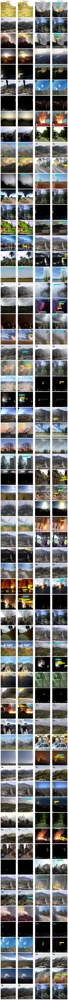

In [14]:
plot_predictions(imgs_dir=test_imgs,
                 labels_dir=test_labels,
                 n_imgs=128,
                 model=squeeze_model,
                 mAP_thres=0.2,
                 iou_thres=0.3, 
                 pic_name='squeeze_8k')

# BIG Model

In [16]:
# plot_predictions(imgs_dir=test_imgs,
#                  labels_dir=test_labels,
#                  n_imgs=128,
#                  model=big_model,
#                  mAP_thres=0.2,
#                  iou_thres=0.3,
#                  #pic_name='big_1M')
#                  pic_name=None)